In [ ]:
#!pip install torch==1.7.1 torchvision==0.8.2 -f https://download.pytorch.org/whl/torch_stable.html
!pip install cython pycocotools scipy tqdm  # Install requirements
!git clone https://github.com/fundamentalvision/Deformable-DETR.git
# Compile the CUDA ops
!cd Deformable-DETR/models/ops && bash make.sh


# change the format of dataset according to the 
code_root/
└── data/
    └── coco/
        ├── train2017/
        ├── val2017/
        └── annotations/
        	├── instances_train2017.json
        	└── instances_val2017.json

In [ ]:
import os
import shutil

# Source dataset directory (handle space)
dataset_dir = "/kaggle/input/melanoma-cancer-for-od-in-coco-format/melanoma cancer.v1i.coco"

# Destination directories
train_src = os.path.join(dataset_dir, "train")
val_src = os.path.join(dataset_dir, "valid")

train_dst = "Deformable-DETR/data/coco/train2017"
val_dst = "Deformable-DETR/data/coco/val2017"
ann_dir = "Deformable-DETR/data/coco/annotations"

# Create folders
os.makedirs(train_dst, exist_ok=True)
os.makedirs(val_dst, exist_ok=True)
os.makedirs(ann_dir, exist_ok=True)

# Copy images only (exclude annotation file)
for filename in os.listdir(train_src):
    if filename != "_annotations.coco.json":
        shutil.copy(os.path.join(train_src, filename), os.path.join(train_dst, filename))

for filename in os.listdir(val_src):
    if filename != "_annotations.coco.json":
        shutil.copy(os.path.join(val_src, filename), os.path.join(val_dst, filename))

# Copy annotation files to proper location
shutil.copyfile(os.path.join(train_src, "_annotations.coco.json"),
                os.path.join(ann_dir, "instances_train2017.json"))
shutil.copyfile(os.path.join(val_src, "_annotations.coco.json"),
                os.path.join(ann_dir, "instances_val2017.json"))



removing one outdated part from misc.py

In [ ]:
file_path = "Deformable-DETR/util/misc.py"

with open(file_path, "r") as f:
    lines = f.readlines()

with open(file_path, "w") as f:
    for line in lines:
        # Skip the problematic import line
        if "from torchvision.ops.misc import _NewEmptyTensorOp" in line:
            continue
        f.write(line)

# assign the number of class from 91 to our class ids =4

In [ ]:
model_file = "Deformable-DETR/models/deformable_detr.py"

with open(model_file, "r") as f:
    code = f.read()

# Force num_classes to 4 if using COCO
patched_code = code.replace(
    "num_classes = 91",
    "num_classes = 4"               # change this to the number of your classes in your dataset
)

with open(model_file, "w") as f:
    f.write(patched_code)

***training code already uses the validation data during training***

In [ ]:
!cd Deformable-DETR && python main.py \
    --dataset_file coco \
    --coco_path ./data/coco \
    --batch_size 2 \
    --epochs 60 \
    --output_dir /kaggle/working/output
# (Optional: add --cache_mode to the above command to load all images into memory) 

# Evaluate the model on the validation set

In [ ]:
!cd Deformable-DETR && python main.py \
    --dataset_file coco \
    --coco_path ./data/coco \
    --output_dir /kaggle/working/output \
    --resume /kaggle/working/output/checkpoint.pth \
    --eval

#  Visualize predictions on test or validation images

In [ ]:
!mv /kaggle/working/Deformable-DETR/datasets /kaggle/working/Deformable-DETR/mydatasets

In [ ]:
import fileinput

file = "/kaggle/working/Deformable-DETR/mydatasets/coco.py"

with fileinput.FileInput(file, inplace=True) as f:
    for line in f:
        print(line.replace("import datasets.transforms", "import mydatasets.transforms"), end="")

In [ ]:
from mydatasets import build_dataset

*******************Here restart the session and run the cell bellow******************

In [1]:
%cd /kaggle/working/Deformable-DETR/models/ops
!python setup.py build install

/kaggle/working/Deformable-DETR/models/ops
/usr/local/lib/python3.10/dist-packages/torch/utils/cpp_extension.py:416: UserWarning: The detected CUDA version (12.2) has a minor version mismatch with the version that was used to compile PyTorch (12.1). Most likely this shouldn't be a problem.
  warnings.warn(CUDA_MISMATCH_WARN.format(cuda_str_version, torch.version.cuda))
/usr/local/lib/python3.10/dist-packages/torch/utils/cpp_extension.py:426: UserWarning: There are no x86_64-linux-gnu-g++ version bounds defined for CUDA version 12.2
  warnings.warn(f'There are no {compiler_name} version bounds defined for CUDA version {cuda_str_version}')
/usr/local/lib/python3.10/dist-packages/torch/utils/cpp_extension.py:1964: UserWarning: TORCH_CUDA_ARCH_LIST is not set, all archs for visible cards are included for compilation. 
If this is not desired, please set os.environ['TORCH_CUDA_ARCH_LIST'].
  warnings.warn(
Emitting ninja build file /kaggle/working/Deformable-DETR/models/ops/build/temp.linux-

<ipython-input-8-7142a70bd730>:17: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path, map_location="cuda")


loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


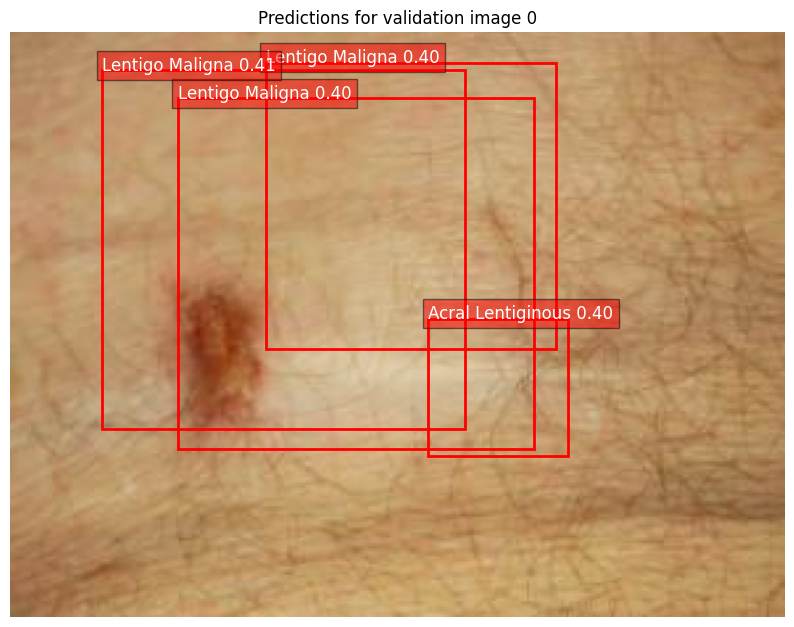

In [8]:
import sys
sys.path.insert(0, "/kaggle/working/Deformable-DETR")  # Prioritize local Deformable-DETR repo

import torch
import matplotlib.pyplot as plt
from pathlib import Path
from PIL import Image

from mydatasets import build_dataset
from models.deformable_detr import build

# Define class names from your dataset
CLASS_NAMES = ["cancer", "Acral Lentiginous", "Lentigo Maligna", "Nodular Melanoma"]

# Load the model and checkpoint
checkpoint_path = "/kaggle/working/output/checkpoint.pth"
checkpoint = torch.load(checkpoint_path, map_location="cuda")
args = checkpoint["args"]

model, _, _ = build(args)
model.load_state_dict(checkpoint["model"])
model.cuda()
model.eval()
# Fix COCO path manually
args.coco_path = "/kaggle/working/Deformable-DETR/data/coco"
# Load validation dataset
dataset = build_dataset(image_set="val", args=args)

# Pick an image to visualize
image_id = 0
image, target = dataset[image_id]
image_tensor = image.unsqueeze(0).cuda()

# Run inference
with torch.no_grad():
    outputs = model(image_tensor)

# Get predictions
logits = outputs["pred_logits"][0]
probs = logits.softmax(-1)
scores, labels = probs.max(-1)
boxes = outputs["pred_boxes"][0]

# Keep predictions with score > 0.4              /////////////////////////////////
keep = scores > 0.4
boxes = boxes[keep]
labels = labels[keep]
scores = scores[keep]

# Convert boxes from cx, cy, w, h → x0, y0, x1, y1
boxes_xyxy = boxes.clone()
boxes_xyxy[:, 0] = boxes[:, 0] - boxes[:, 2] / 2
boxes_xyxy[:, 1] = boxes[:, 1] - boxes[:, 3] / 2
boxes_xyxy[:, 2] = boxes[:, 0] + boxes[:, 2] / 2
boxes_xyxy[:, 3] = boxes[:, 1] + boxes[:, 3] / 2

# Scale to original image dimensions
image_info = dataset.coco.loadImgs(target["image_id"].item())[0]
image_path = Path(args.coco_path) / "val2017" / image_info["file_name"]
image_pil = Image.open(image_path).convert("RGB")

w, h = image_pil.size
boxes_xyxy = boxes_xyxy * torch.tensor([w, h, w, h]).cuda()

# Plot
plt.figure(figsize=(10, 10))
plt.imshow(image_pil)
ax = plt.gca()

for box, label, score in zip(boxes_xyxy, labels, scores):
    x0, y0, x1, y1 = box.tolist()
    ax.add_patch(plt.Rectangle((x0, y0), x1 - x0, y1 - y0,
                 fill=False, edgecolor='red', linewidth=2))
    ax.text(x0, y0, f"{CLASS_NAMES[label.item()]} {score:.2f}",
            color='white', fontsize=12, bbox=dict(facecolor='red', alpha=0.5))

plt.axis('off')
plt.title(f"Predictions for validation image {image_id}")
plt.show()


# Visualize multiple validation images

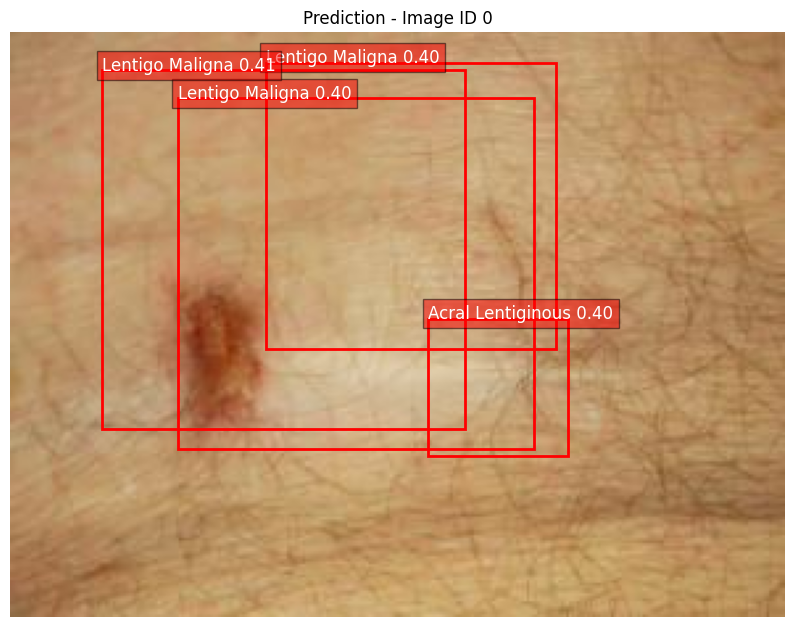

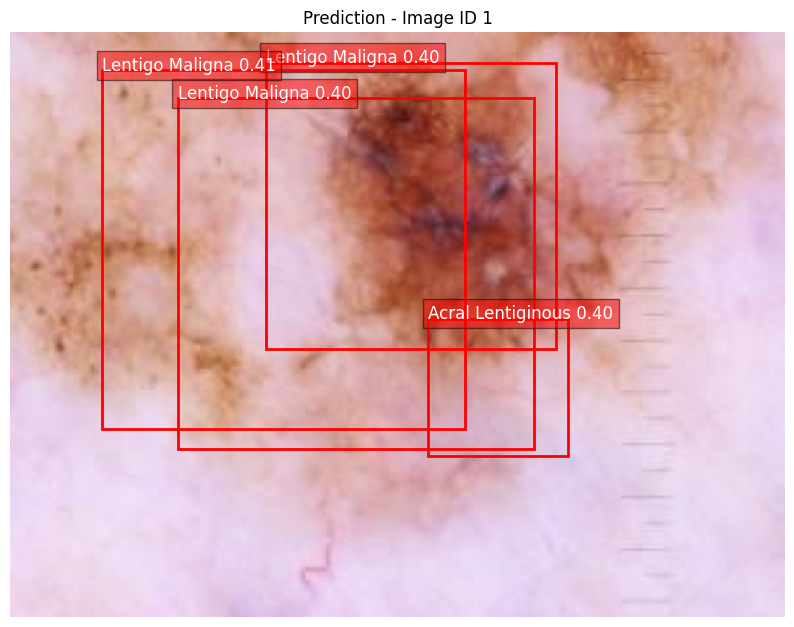

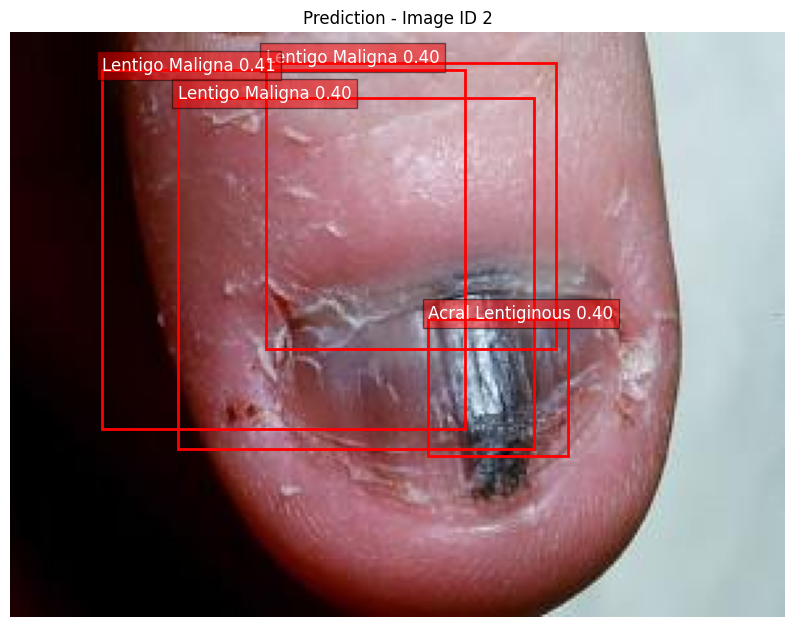

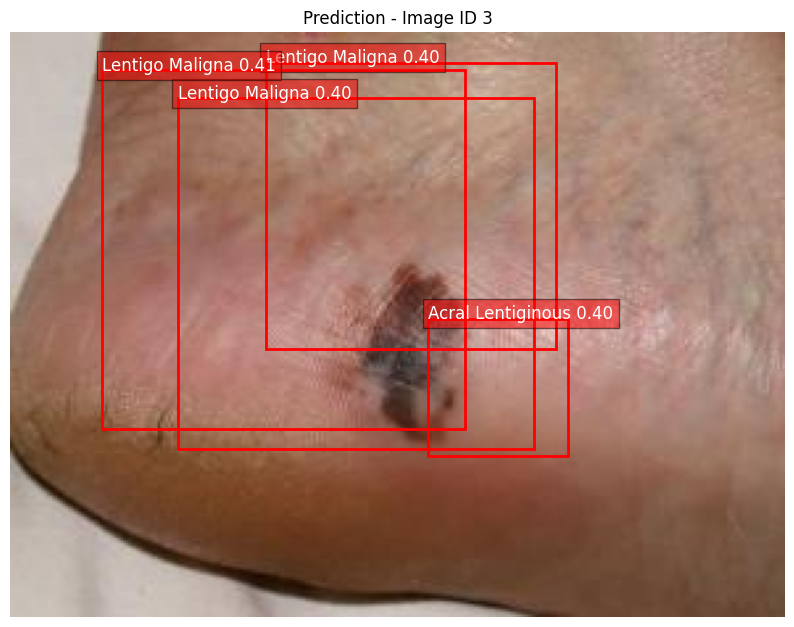

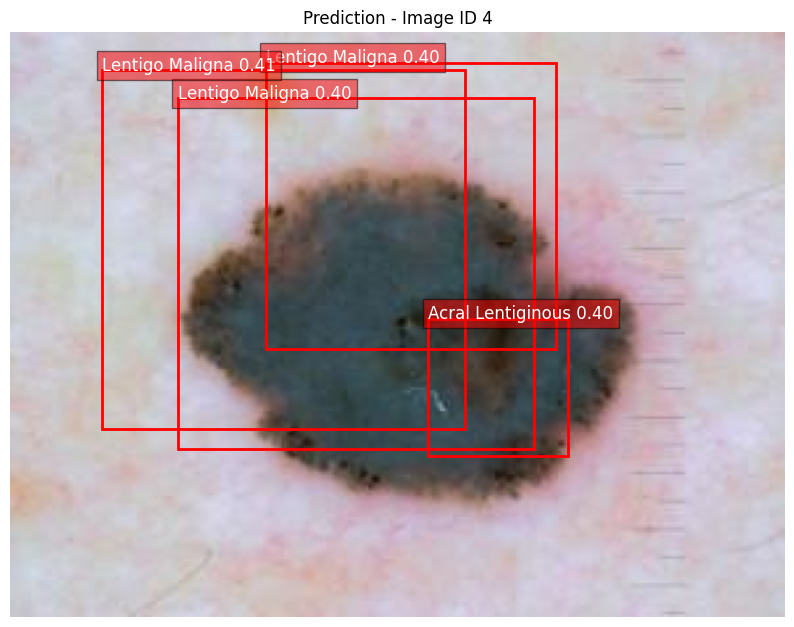

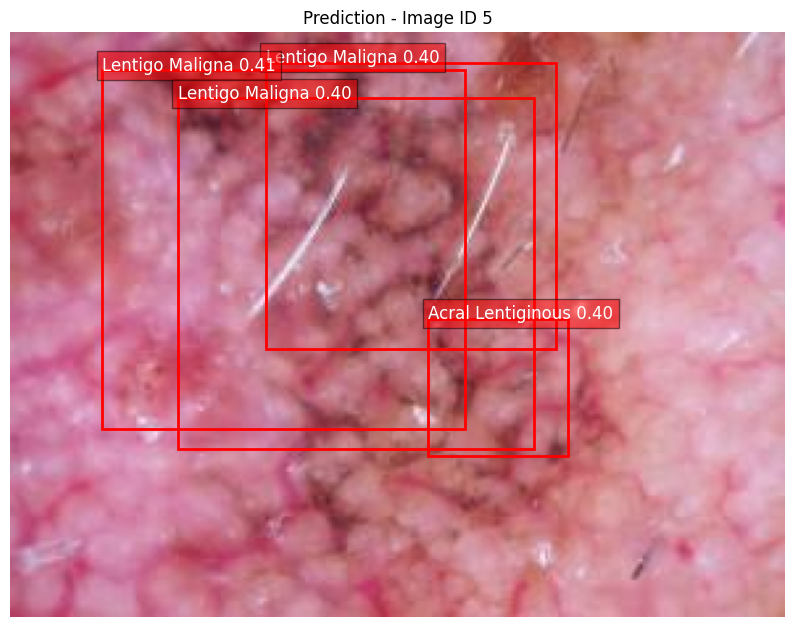

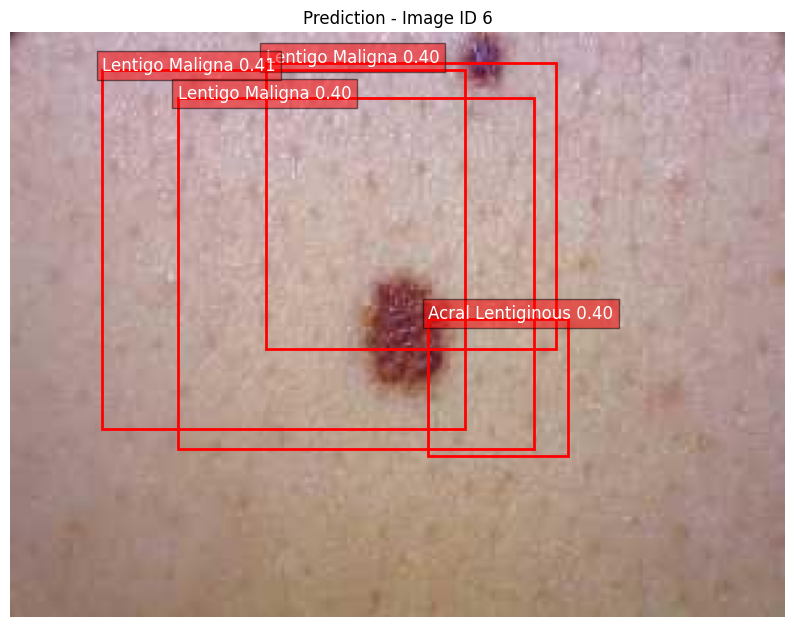

In [10]:
num_images = 7  # Change to view more
for image_id in range(num_images):
    image, target = dataset[image_id]
    image_tensor = image.unsqueeze(0).cuda()

    with torch.no_grad():
        outputs = model(image_tensor)

    logits = outputs["pred_logits"][0]
    probs = logits.softmax(-1)
    scores, labels = probs.max(-1)
    boxes = outputs["pred_boxes"][0]

    keep = scores > 0.4
    boxes = boxes[keep]
    labels = labels[keep]
    scores = scores[keep]

    boxes_xyxy = boxes.clone()
    boxes_xyxy[:, 0] = boxes[:, 0] - boxes[:, 2] / 2
    boxes_xyxy[:, 1] = boxes[:, 1] - boxes[:, 3] / 2
    boxes_xyxy[:, 2] = boxes[:, 0] + boxes[:, 2] / 2
    boxes_xyxy[:, 3] = boxes[:, 1] + boxes[:, 3] / 2

    image_info = dataset.coco.loadImgs(target["image_id"].item())[0]
    image_path = Path(args.coco_path) / "val2017" / image_info["file_name"]
    image_pil = Image.open(image_path).convert("RGB")
    w, h = image_pil.size
    boxes_xyxy = boxes_xyxy * torch.tensor([w, h, w, h]).cuda()

    plt.figure(figsize=(10, 10))
    plt.imshow(image_pil)
    ax = plt.gca()

    for box, label, score in zip(boxes_xyxy, labels, scores):
        x0, y0, x1, y1 = box.tolist()
        ax.add_patch(plt.Rectangle((x0, y0), x1 - x0, y1 - y0,
                     fill=False, edgecolor='red', linewidth=2))
        ax.text(x0, y0, f"{CLASS_NAMES[label.item()]} {score:.2f}",
                color='white', fontsize=12, bbox=dict(facecolor='red', alpha=0.5))

    plt.axis('off')
    plt.title(f"Prediction - Image ID {image_id}")
    plt.savefig(f"/kaggle/working/prediction_{image_id}.png")
    plt.show()

#  Save predictions as PNGs and JSON

In [11]:
import json
from tqdm import tqdm

save_dir = Path("/kaggle/working/predictions")
save_dir.mkdir(parents=True, exist_ok=True)
json_results = []

for image_id in tqdm(range(len(dataset))):
    image, target = dataset[image_id]
    image_tensor = image.unsqueeze(0).cuda()

    with torch.no_grad():
        outputs = model(image_tensor)

    logits = outputs["pred_logits"][0]
    probs = logits.softmax(-1)
    scores, labels = probs.max(-1)
    boxes = outputs["pred_boxes"][0]

    keep = scores > 0.7
    boxes = boxes[keep]
    labels = labels[keep]
    scores = scores[keep]

    boxes_xyxy = boxes.clone()
    boxes_xyxy[:, 0] = boxes[:, 0] - boxes[:, 2] / 2
    boxes_xyxy[:, 1] = boxes[:, 1] - boxes[:, 3] / 2
    boxes_xyxy[:, 2] = boxes[:, 0] + boxes[:, 2] / 2
    boxes_xyxy[:, 3] = boxes[:, 1] + boxes[:, 3] / 2

    image_info = dataset.coco.loadImgs(target["image_id"].item())[0]
    file_name = image_info["file_name"]
    image_path = Path(args.coco_path) / "val2017" / file_name
    image_pil = Image.open(image_path).convert("RGB")
    w, h = image_pil.size
    boxes_xyxy = boxes_xyxy * torch.tensor([w, h, w, h]).cuda()

    # Save JSON
    for box, label, score in zip(boxes_xyxy, labels, scores):
        json_results.append({
            "image_id": target["image_id"].item(),
            "category_id": label.item(),
            "score": round(score.item(), 4),
            "bbox": [round(b.item(), 2) for b in box.tolist()]
        })

    # Save PNG
    plt.figure(figsize=(10, 10))
    plt.imshow(image_pil)
    ax = plt.gca()
    for box, label, score in zip(boxes_xyxy, labels, scores):
        x0, y0, x1, y1 = box.tolist()
        ax.add_patch(plt.Rectangle((x0, y0), x1 - x0, y1 - y0,
                     fill=False, edgecolor='red', linewidth=2))
        ax.text(x0, y0, f"{CLASS_NAMES[label.item()]} {score:.2f}",
                color='white', fontsize=12, bbox=dict(facecolor='red', alpha=0.5))
    plt.axis('off')
    plt.savefig(save_dir / f"{file_name}.png", bbox_inches="tight")
    plt.close()

# Save the JSON
with open(save_dir / "detections.json", "w") as f:
    json.dump(json_results, f, indent=2)

print("✅ Saved predictions to:", save_dir)


100%|██████████| 45/45 [00:21<00:00,  2.14it/s]

✅ Saved predictions to: /kaggle/working/predictions


# Evaluate mAP (COCO metrics)

In [12]:
import fileinput

with fileinput.FileInput("/kaggle/working/Deformable-DETR/engine.py", inplace=True) as f:
    for line in f:
        print(line.replace("from datasets", "from mydatasets"), end="")

In [13]:
from mydatasets.coco_eval import CocoEvaluator
from mydatasets.coco import build as build_coco
from engine import evaluate
import util.misc as utils
from models import build_model
from torch.utils.data import DataLoader

# Reload model, criterion, postprocessors (if not already available)
model, criterion, postprocessors = build_model(args)
model.load_state_dict(checkpoint["model"])
model.cuda()
model.eval()

# Build dataset and data loader
coco_val = build_coco("val", args)
val_loader = DataLoader(coco_val, batch_size=2, shuffle=False, collate_fn=utils.collate_fn)

# Run evaluation
evaluate(model, criterion, postprocessors, val_loader, coco_val.coco, device=torch.device("cuda"), output_dir=args.output_dir)

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
Test:  [ 0/23]  eta: 0:00:09  class_error: 50.00  loss: 20.4113 (20.4113)  loss_ce: 1.3972 (1.3972)  loss_bbox: 1.2551 (1.2551)  loss_giou: 0.8338 (0.8338)  loss_ce_0: 1.4788 (1.4788)  loss_bbox_0: 1.3200 (1.3200)  loss_giou_0: 0.7850 (0.7850)  loss_ce_1: 1.3617 (1.3617)  loss_bbox_1: 1.1458 (1.1458)  loss_giou_1: 0.7622 (0.7622)  loss_ce_2: 1.3599 (1.3599)  loss_bbox_2: 1.1568 (1.1568)  loss_giou_2: 0.8568 (0.8568)  loss_ce_3: 1.4295 (1.4295)  loss_bbox_3: 1.2338 (1.2338)  loss_giou_3: 0.7776 (0.7776)  loss_ce_4: 1.3168 (1.3168)  loss_bbox_4: 1.1729 (1.1729)  loss_giou_4: 0.7675 (0.7675)  loss_ce_unscaled: 0.6986 (0.6986)  class_error_unscaled: 50.0000 (50.0000)  loss_bbox_unscaled: 0.2510 (0.2510)  loss_giou_unscaled: 0.4169 (0.4169)  cardinality_error_unscaled: 299.0000 (299.0000)  loss_ce_0_unscaled: 0.7394 (0.7394)  loss_bbox_0_unscaled: 0.2640 (0.2640)  loss_giou_0_unscaled: 0.3925 (0.3925)  cardin

({'class_error': 54.34782608695652,
  'loss': 15.010795842046322,
  'loss_ce': 1.1218103688696157,
  'loss_bbox': 0.8477281902147376,
  'loss_giou': 0.5328367922617041,
  'loss_ce_0': 1.1577833994575168,
  'loss_bbox_0': 0.8476469063240549,
  'loss_giou_0': 0.535264676031859,
  'loss_ce_1': 1.1502797163051108,
  'loss_bbox_1': 0.8142282379710156,
  'loss_giou_1': 0.512795046619747,
  'loss_ce_2': 1.1313197638677515,
  'loss_bbox_2': 0.8461541352064713,
  'loss_giou_2': 0.5442874483440233,
  'loss_ce_3': 1.1340195329292961,
  'loss_bbox_3': 0.8124508287595666,
  'loss_giou_3': 0.5079934493355129,
  'loss_ce_4': 1.1429588224576868,
  'loss_bbox_4': 0.8363845166952714,
  'loss_giou_4': 0.5348544457684392,
  'loss_ce_unscaled': 0.5609051844348079,
  'class_error_unscaled': 54.34782608695652,
  'loss_bbox_unscaled': 0.16954563752464627,
  'loss_giou_unscaled': 0.26641839613085205,
  'cardinality_error_unscaled': 299.0,
  'loss_ce_0_unscaled': 0.5788916997287584,
  'loss_bbox_0_unscaled': 0.

In [14]:
transforms_path = "/kaggle/working/Deformable-DETR/mydatasets/transforms.py"

make_coco_fn = """
def make_coco_transforms(image_set):
    normalize = Compose([
        ToTensor(),
        Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])

    if image_set in ['val', 'test']:
        return Compose([
            Resize([800], max_size=1333),
            normalize,
        ])
    raise ValueError(f'unknown {image_set}')
"""

with open(transforms_path, "a") as f:
    f.write(make_coco_fn)

In [15]:
# Remove the faulty import if it already exists
with open(transforms_path, "r") as f:
    lines = f.readlines()

with open(transforms_path, "w") as f:
    for line in lines:
        if "from .transforms import" not in line:
            f.write(line)

In [16]:
import importlib.util
import sys

sys.modules.pop("mydatasets.transforms", None)

spec = importlib.util.spec_from_file_location("mydatasets.transforms", transforms_path)
T = importlib.util.module_from_spec(spec)
spec.loader.exec_module(T)

In [17]:
# Full correct version of transforms.py (overwrite everything)
fixed_transforms_py = """
import torch
from torchvision import transforms as tvt

class Compose(object):
    def __init__(self, transforms):
        self.transforms = transforms

    def __call__(self, image, target=None):
        for t in self.transforms:
            image, target = t(image, target)
        return image, target

class ToTensor(object):
    def __call__(self, image, target=None):
        return tvt.ToTensor()(image), target

class Normalize(object):
    def __init__(self, mean, std):
        self.normalize = tvt.Normalize(mean, std)

    def __call__(self, image, target=None):
        return self.normalize(image), target

class RandomResize(object):
    def __init__(self, sizes, max_size=None):
        self.sizes = sizes
        self.max_size = max_size

    def __call__(self, image, target=None):
        size = self.sizes[0]  # Single size for simplicity
        w, h = image.size
        scale = size / min(h, w)
        if self.max_size is not None and max(h, w) * scale > self.max_size:
            scale = self.max_size / max(h, w)
        ow, oh = int(w * scale), int(h * scale)
        image = image.resize((ow, oh))
        return image, target

def make_coco_transforms(image_set):
    normalize = Compose([
        ToTensor(),
        Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])

    if image_set in ['val', 'test']:
        return Compose([
            RandomResize([800], max_size=1333),
            normalize,
        ])

    raise ValueError(f"Unknown image_set: {image_set}")
"""

# Save clean file
with open(transforms_path, "w") as f:
    f.write(fixed_transforms_py.strip())

# Reload the module cleanly
import importlib.util
import sys

sys.modules.pop("mydatasets.transforms", None)

spec = importlib.util.spec_from_file_location("mydatasets.transforms", transforms_path)
T = importlib.util.module_from_spec(spec)
spec.loader.exec_module(T)


In [19]:
from pathlib import Path
from PIL import Image
import torch
from torch.utils.data import Dataset
from torchvision.transforms import Compose, ToTensor, Normalize, Resize

class TestDataset(Dataset):
    def __init__(self, test_dir):
        self.img_paths = list(Path(test_dir).glob("*.jpg")) + list(Path(test_dir).glob("*.png"))
        self.transform = Compose([
            Resize([800]),
            ToTensor(),
            Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
        ])

    def __getitem__(self, idx):
        img_path = self.img_paths[idx]
        img = Image.open(img_path).convert("RGB")
        img_tensor = self.transform(img)
        return img_tensor, str(img_path)

    def __len__(self):
        return len(self.img_paths)


In [ ]:
test_dataset = TestDataset("/kaggle/input/melanoma-cancer-for-od-in-coco-format/melanoma cancer.v1i.coco/test")
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=1, shuffle=False)

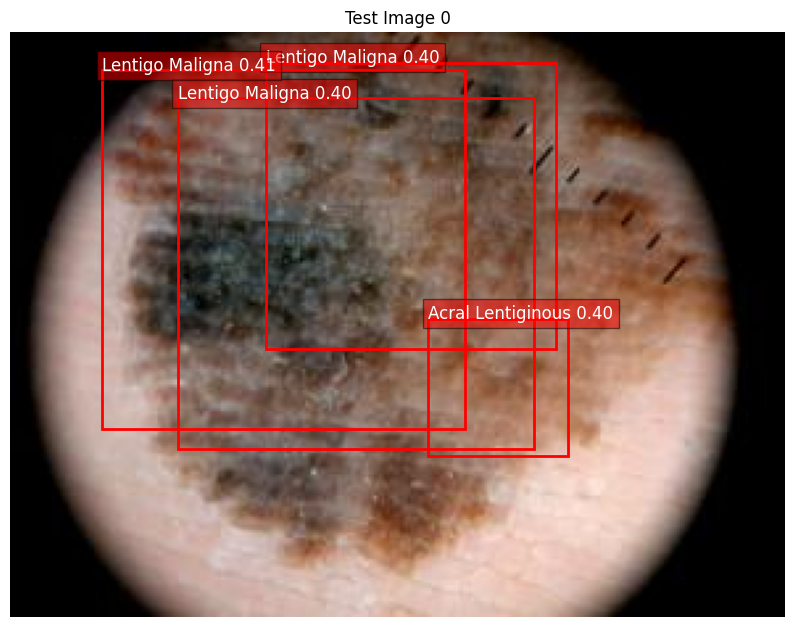

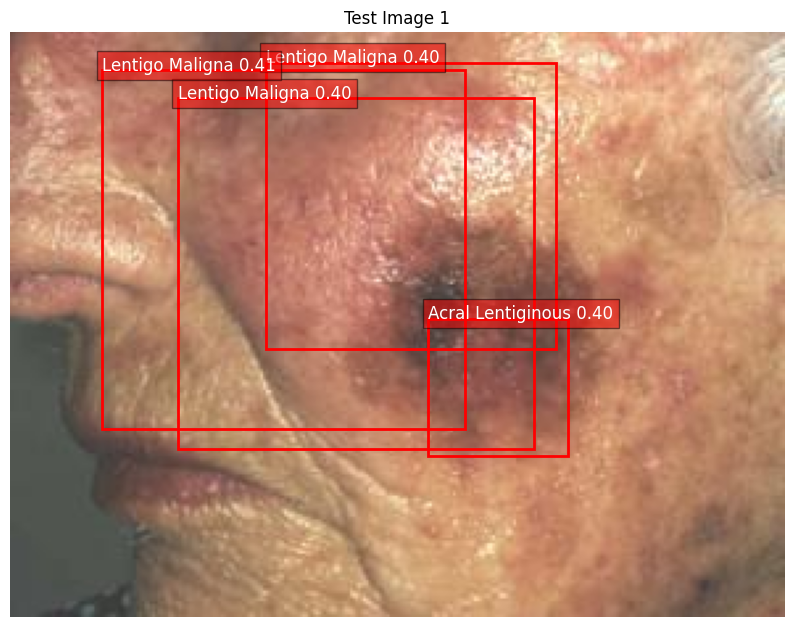

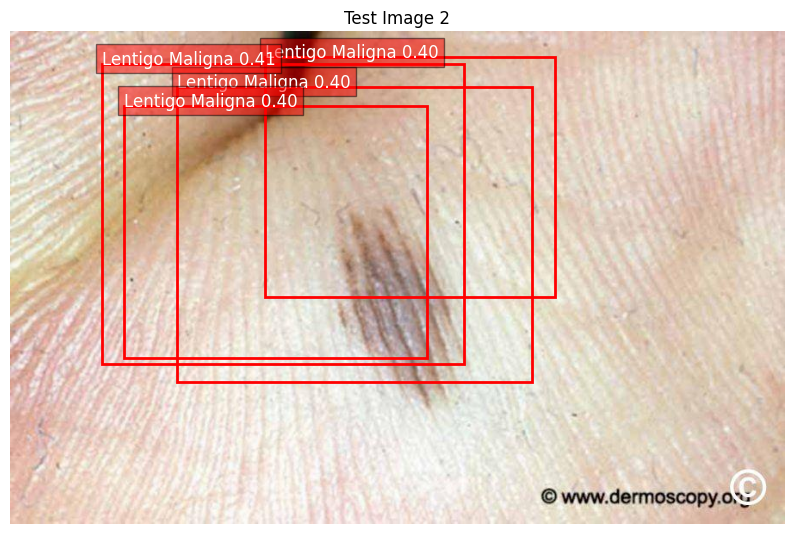

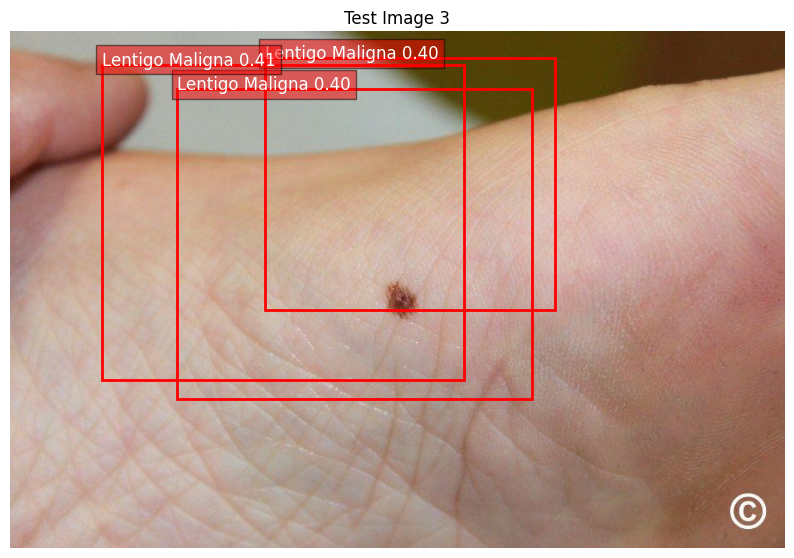

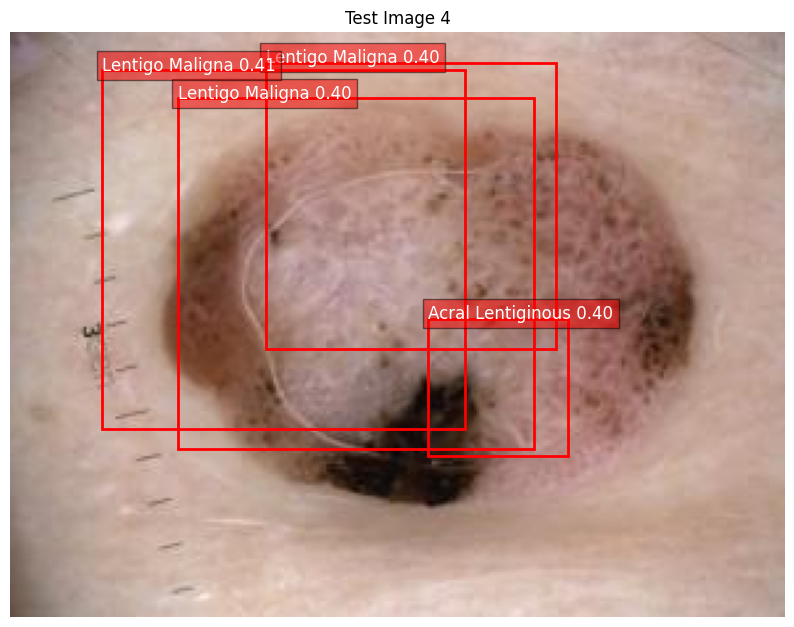

...

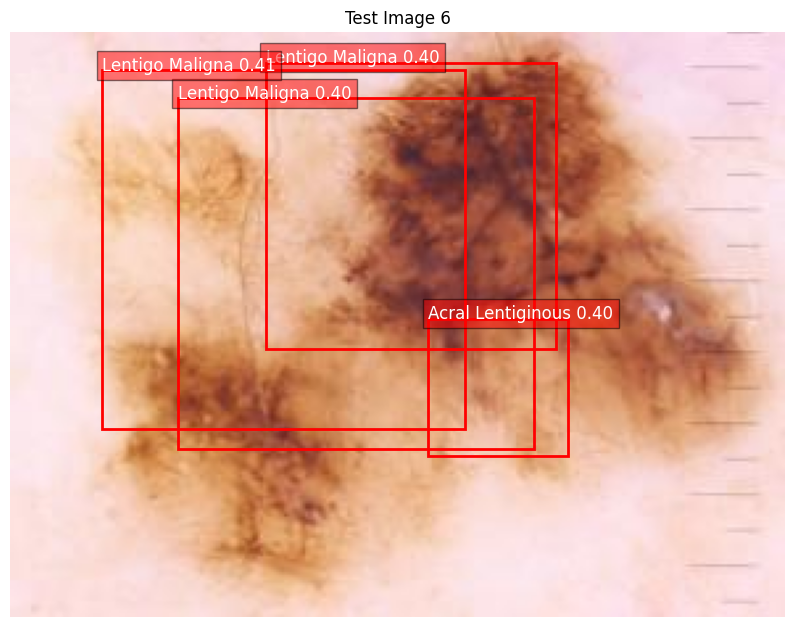

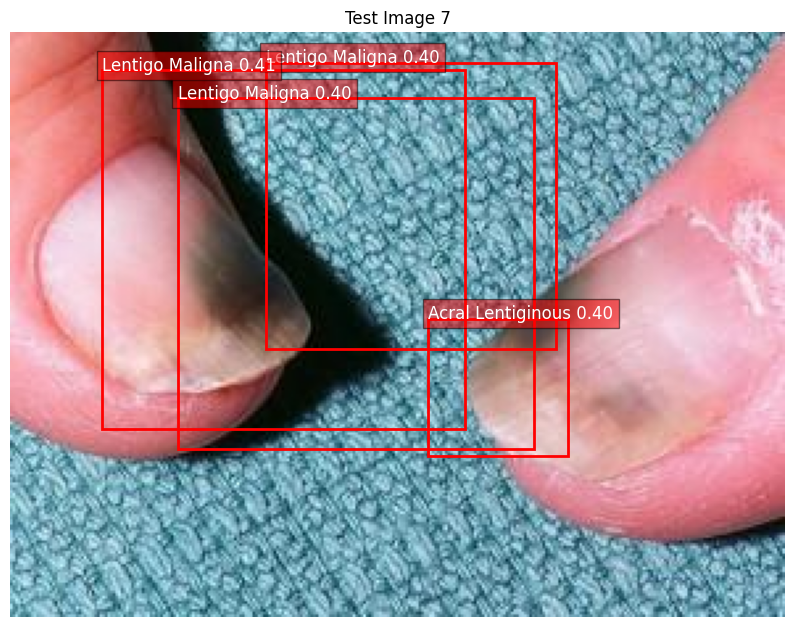

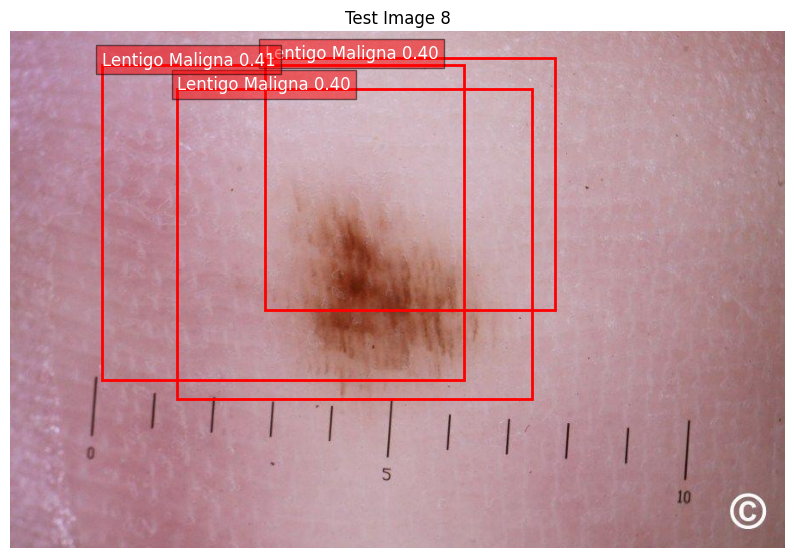

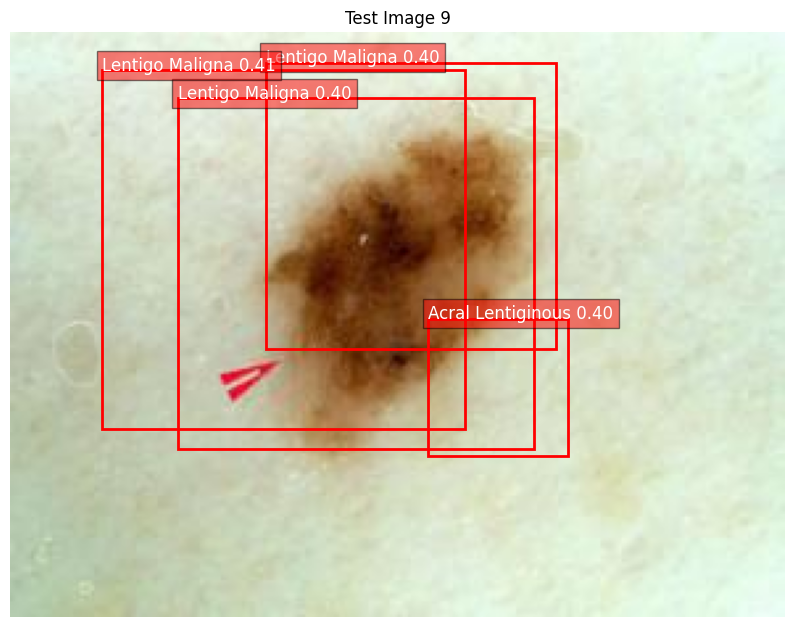

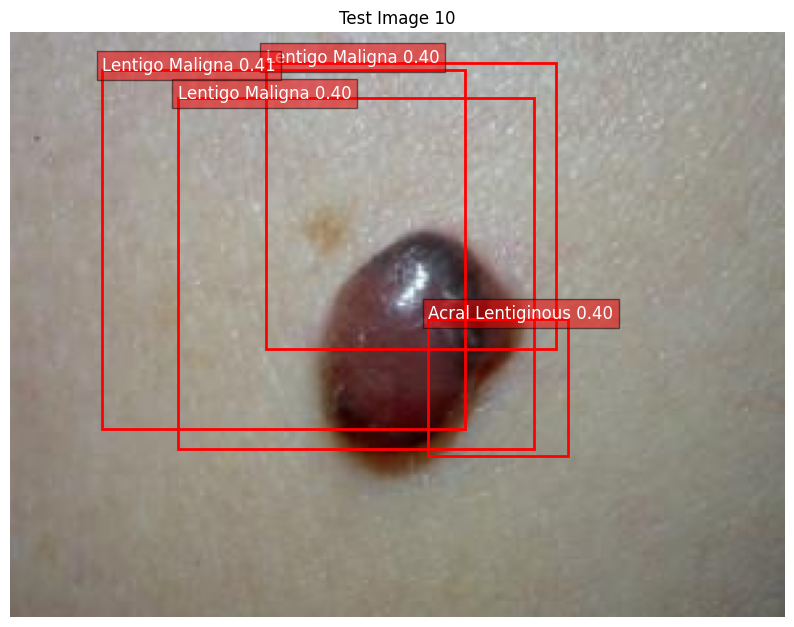

In [23]:
from matplotlib import pyplot as plt

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
model.eval()

for idx, (image, image_path) in enumerate(test_loader):
    image = image.to(device)
    with torch.no_grad():
        outputs = model(image)

    

    # Get predictions
    logits = outputs["pred_logits"][0]
    probs = logits.softmax(-1)
    scores, labels = probs.max(-1)
    boxes = outputs["pred_boxes"][0]

    # Filter low confidence
    keep = scores > 0.4              #////////////////////
    boxes = boxes[keep]
    labels = labels[keep]
    scores = scores[keep]

    # Convert boxes to (x0, y0, x1, y1)
    boxes_xyxy = boxes.clone()
    boxes_xyxy[:, 0] = boxes[:, 0] - boxes[:, 2] / 2
    boxes_xyxy[:, 1] = boxes[:, 1] - boxes[:, 3] / 2
    boxes_xyxy[:, 2] = boxes[:, 0] + boxes[:, 2] / 2
    boxes_xyxy[:, 3] = boxes[:, 1] + boxes[:, 3] / 2

    # Load original image for plotting
    from PIL import Image
    pil_img = Image.open(image_path[0]).convert("RGB")
    w, h = pil_img.size
    boxes_xyxy = boxes_xyxy * torch.tensor([w, h, w, h], device=device)

    # Plot
    plt.figure(figsize=(10, 10))
    plt.imshow(pil_img)
    ax = plt.gca()
    for box, label, score in zip(boxes_xyxy, labels, scores):
        x0, y0, x1, y1 = box.tolist()
        ax.add_patch(plt.Rectangle((x0, y0), x1 - x0, y1 - y0,
                     fill=False, edgecolor='red', linewidth=2))
        ax.text(x0, y0, f"{CLASS_NAMES[label.item()]} {score:.2f}",
                color='white', fontsize=12, bbox=dict(facecolor='red', alpha=0.5))

    plt.axis('off')
    plt.title(f"Test Image {idx}")
    plt.savefig(f"/kaggle/working/prediction_{image_id}.png")
    plt.show()

    if idx == 10:  # limit to first 5 images for now
        break


# Save Predictions as JSON

In [24]:
import json

results = []

for idx, (image, path) in enumerate(test_loader):
    image = image.to(device)
    with torch.no_grad():
        outputs = model(image)

    logits = outputs['pred_logits'][0]
    boxes = outputs['pred_boxes'][0]
    probs = logits.softmax(-1)
    scores, labels = probs.max(-1)

    keep = scores > 0.7
    boxes = boxes[keep].cpu()
    labels = labels[keep].cpu()
    scores = scores[keep].cpu()

    for box, label, score in zip(boxes, labels, scores):
        cx, cy, w, h = box.tolist()
        x0 = cx - w / 2
        y0 = cy - h / 2
        x1 = cx + w / 2
        y1 = cy + h / 2

        results.append({
            "image": path[0],
            "label": int(label),
            "score": float(score),
            "bbox": [x0, y0, x1, y1]
        })

# Save to JSON
with open("/kaggle/working/predictions.json", "w") as f:
    json.dump(results, f, indent=2)